In [1]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# local
from NanTex_backend.Util.pyDialogue import pyDialogue

In [2]:
## grab files
paths_in = pyDialogue.askFILES()
data_in = [np.load(path) for path in paths_in]

In [3]:
stats = []
min_max = []
for file in data_in:
    stats.append([np.mean(file), np.std(file)])
    min_max.append([np.min(file), np.max(file)])

In [4]:
## some conveience
def plot_example(data, title):
    fig, ax = plt.subplots()
    ax.imshow(data, cmap='gray')
    ax.set_title(title)
    ax.axis('off')
    return fig, ax#

def plot_original_and_modified(data, modified, title):
    fig, ax = plt.subplots(1, 2, figsize = (10, 5), dpi = 300)
    ax[0].imshow(data, cmap='gray')
    ax[0].set_title('Original')
    ax[0].axis('off')
    ax[1].imshow(modified, cmap='gray')
    ax[1].set_title('Modified')
    ax[1].axis('off')
    fig.suptitle(title)
    return fig, ax

In [5]:
import skimage
import cv2

(<Figure size 3000x1500 with 2 Axes>,
 array([<Axes: title={'center': 'Original'}>,
        <Axes: title={'center': 'Modified'}>], dtype=object))

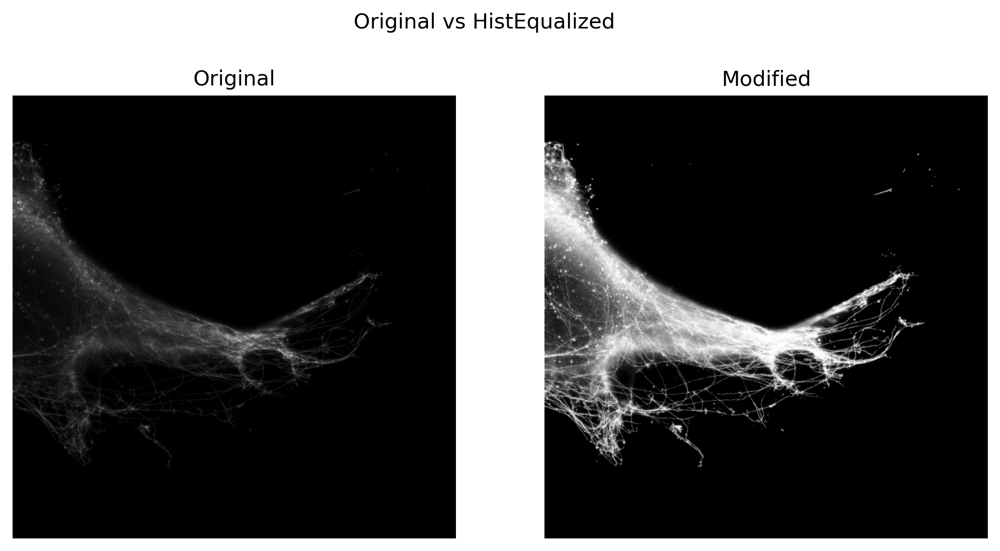

In [6]:
# histogram equalization
original = data_in[2]
modified = cv2.equalizeHist(original.astype(np.uint8))

plot_original_and_modified(data = original,
                           modified = modified,
                           title = 'Original vs HistEqualized')

(<Figure size 3000x1500 with 2 Axes>,
 array([<Axes: title={'center': 'Original'}>,
        <Axes: title={'center': 'Modified'}>], dtype=object))

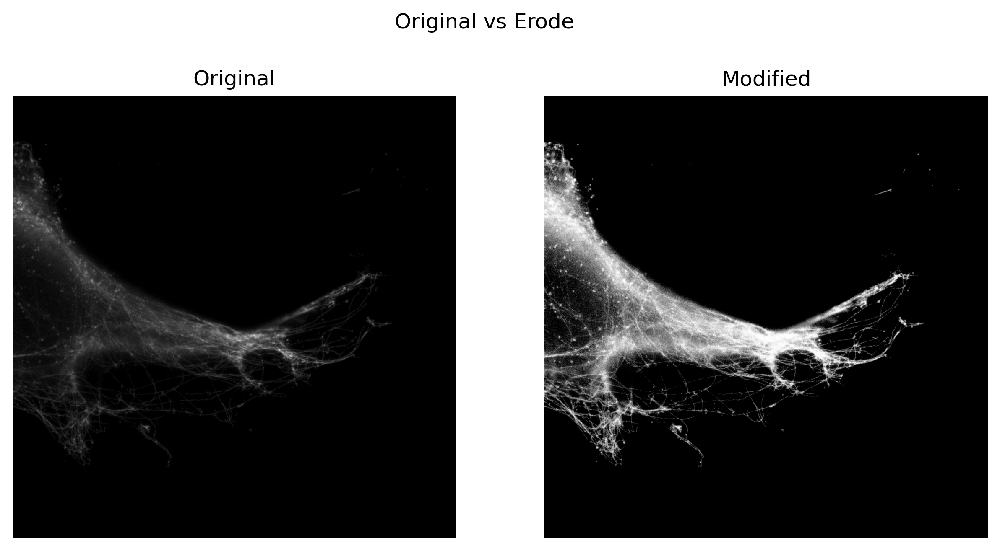

In [7]:
# erosion
kernel = np.ones((2,2),np.uint8)

original = data_in[2]
modified = cv2.equalizeHist(modified.astype(np.uint8))
modified = cv2.erode(modified, kernel, iterations = 1)

plot_original_and_modified(data = original,
                           modified = modified,
                           title = 'Original vs Erode')

(<Figure size 3000x1500 with 2 Axes>,
 array([<Axes: title={'center': 'Original'}>,
        <Axes: title={'center': 'Modified'}>], dtype=object))

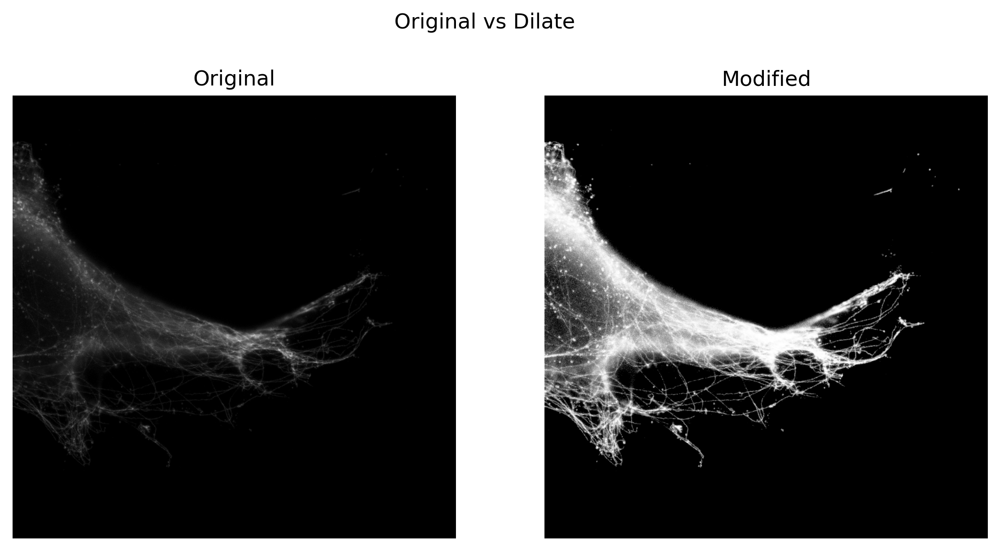

In [8]:
# dilaion
kernel = np.ones((3,3),np.uint8)

original = data_in[2]
modified = cv2.equalizeHist(modified.astype(np.uint8))
modified = cv2.dilate(modified, kernel, iterations = 1)

plot_original_and_modified(data = original,
                           modified = modified,
                           title = 'Original vs Dilate')

(2497, 2497) 0 255


(<Figure size 3000x1500 with 2 Axes>,
 array([<Axes: title={'center': 'Original'}>,
        <Axes: title={'center': 'Modified'}>], dtype=object))

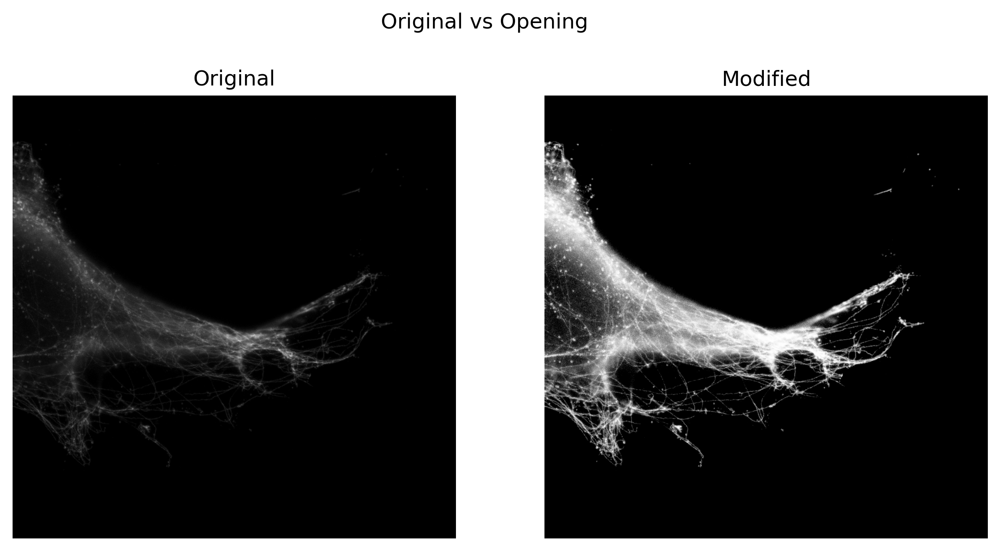

In [9]:
# opening
kernel = np.ones((2,2),np.uint8)

original = data_in[2]
modified = cv2.equalizeHist(original.astype(np.uint8))
modified_1 = skimage.morphology.opening(modified, kernel)
print(modified_1.shape, np.min(modified_1), np.max(modified_1))

plot_original_and_modified(data = original,
                           modified = modified_1,
                           title = 'Original vs Opening')

(2497, 2497) 0 255


(<Figure size 3000x1500 with 2 Axes>,
 array([<Axes: title={'center': 'Original'}>,
        <Axes: title={'center': 'Modified'}>], dtype=object))

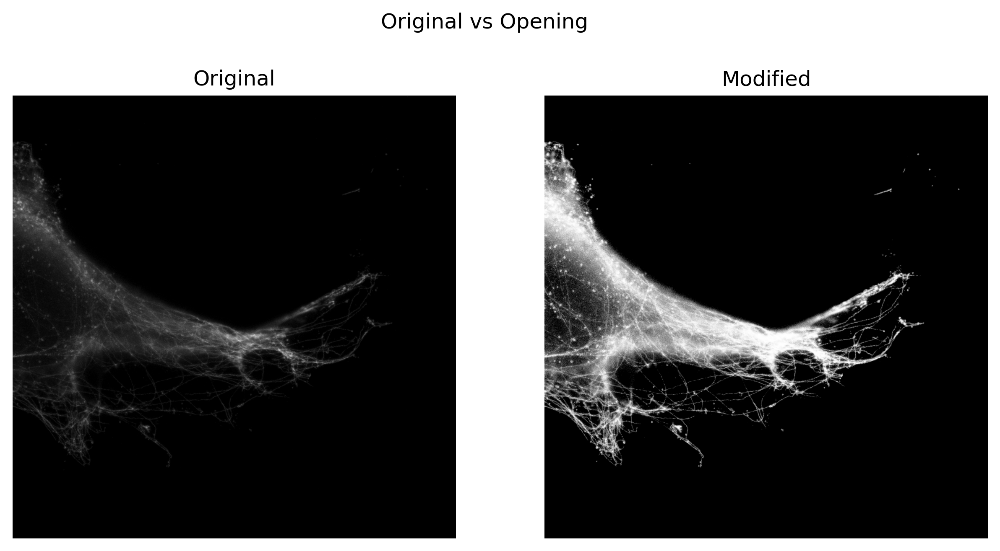

In [10]:
# opening
kernel = np.ones((2,2),np.uint8)

original = data_in[2]
modified = skimage.morphology.opening(original, kernel)
modified_2 = cv2.equalizeHist(modified.astype(np.uint8))
print(modified_2.shape, np.min(modified_2), np.max(modified_2))

plot_original_and_modified(data = original,
                           modified = modified_2,
                           title = 'Original vs Opening')

(<Figure size 3000x1500 with 2 Axes>,
 array([<Axes: title={'center': 'Original'}>,
        <Axes: title={'center': 'Modified'}>], dtype=object))

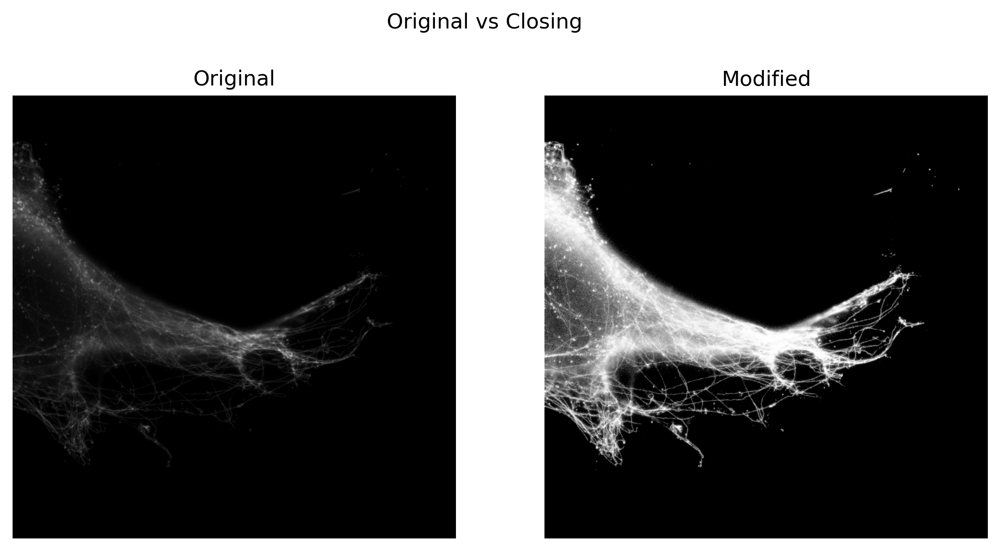

In [11]:
# Closing
kernel = np.ones((3,3),np.uint8)

original = data_in[2]
modified = cv2.equalizeHist(original.astype(np.uint8))
modified = skimage.morphology.closing(modified, kernel)

plot_original_and_modified(data = original,
                           modified = modified,
                           title = 'Original vs Closing')

(<Figure size 3000x1500 with 2 Axes>,
 array([<Axes: title={'center': 'Original'}>,
        <Axes: title={'center': 'Modified'}>], dtype=object))

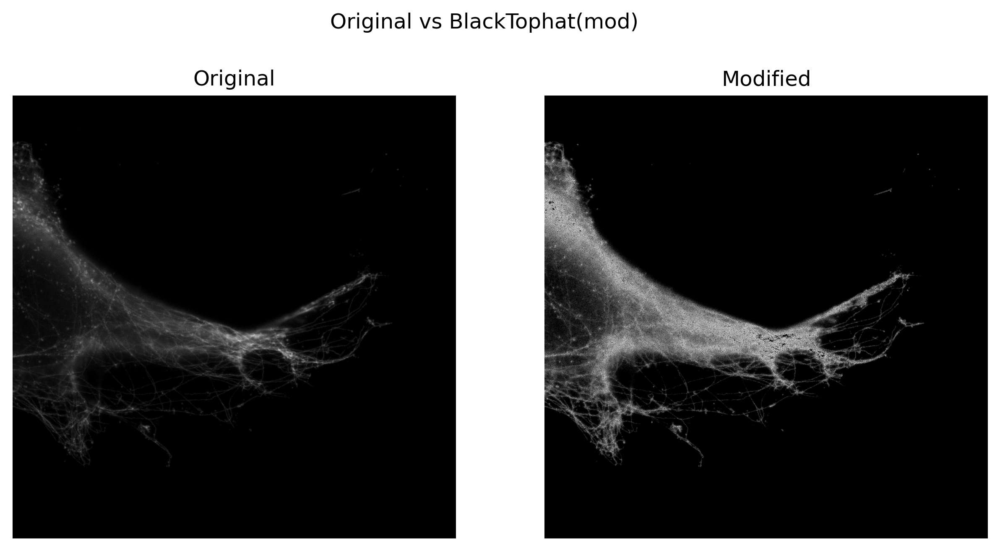

In [12]:
# black tophat
# img - closing(img)

original = data_in[2]
modified = cv2.equalizeHist(original.astype(np.uint8))
modified = skimage.morphology.black_tophat(modified, footprint = np.ones((3,3),np.uint8))
modified = np.where(modified > 0, cv2.equalizeHist(original.astype(np.uint8)), 0)
#modified = original - modified


plot_original_and_modified(data = original,
                           modified = modified,
                           title = 'Original vs BlackTophat(mod)')


(<Figure size 3000x1500 with 2 Axes>,
 array([<Axes: title={'center': 'Original'}>,
        <Axes: title={'center': 'Modified'}>], dtype=object))

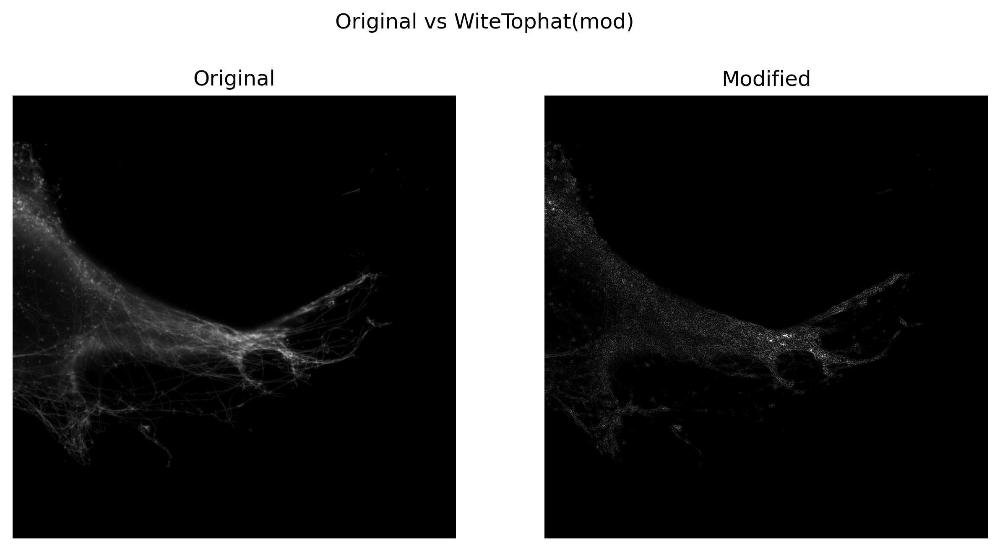

In [13]:
# white tophat
# img - opening(img)

original = data_in[2]
modified = cv2.equalizeHist(original.astype(np.uint8))
modified = skimage.morphology.white_tophat(modified, footprint = np.ones((5,5),np.uint8))
modified = np.where(modified > 0, cv2.equalizeHist(original.astype(np.uint8)),0)
modified = cv2.equalizeHist(original.astype(np.uint8)) - modified


plot_original_and_modified(data = original,
                           modified = modified,
                           title = 'Original vs WiteTophat(mod)')


In [17]:
## Apply Modification
# 1. Histogram equalization to enhance the contrast of the image
# 2. Calculate the opening (erosion followed by dilation) of the image to open up the gaps between the structures

from typing import List, Union, Dict

def apply_modifications(files:Dict[str,np.ndarray], kernel:np.ndarray) -> List[np.ndarray]:
    """
    Apply modifications to the input files
    """
    modified_files = {}
    for file, data in files.items():
        #modified = cv2.equalizeHist(data.astype(np.uint8))
        modified = skimage.morphology.opening(data, kernel)
        modified_files[file] = modified
    return modified_files

def save_files(files:Dict[str,np.ndarray], path:str):
    """
    Save the files to the given path
    """
    for file, data in files.items():
        np.save(path + '/modified_' +  file.split('/')[-1], data)
        
files:Union[List[str], Dict[str,np.ndarray]]
files = pyDialogue.askFILES()
files = {file:np.load(file) for file in files}

kernel = np.ones((2,2),np.uint8)

modified_files = apply_modifications(files, kernel)
save_files(modified_files, path = pyDialogue.askDIR())

C:\Users\belav\AppData\Local\Temp\ipykernel_5268\1079214156.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


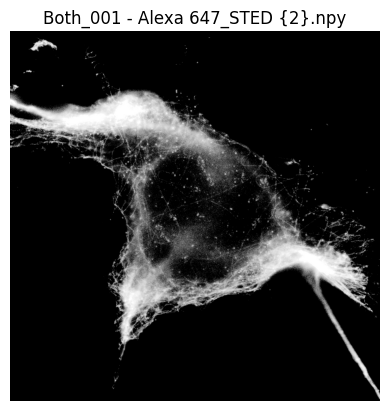

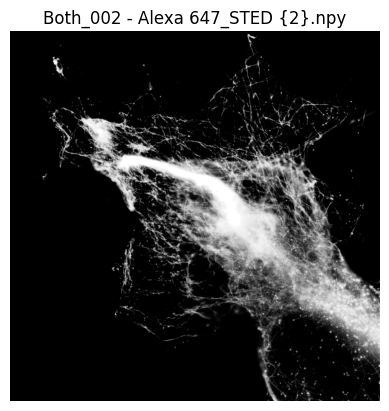

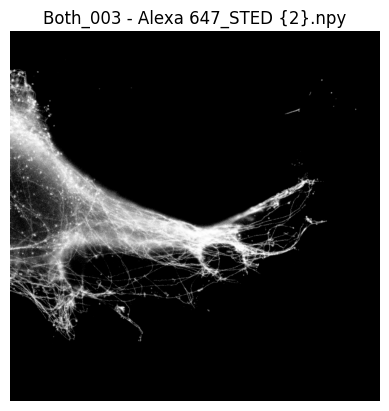

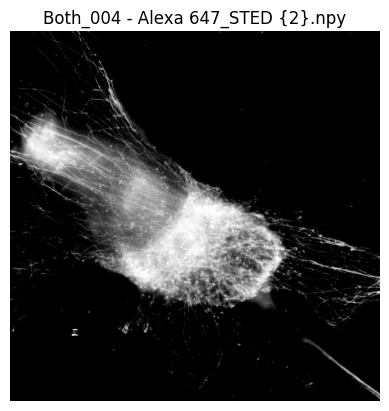

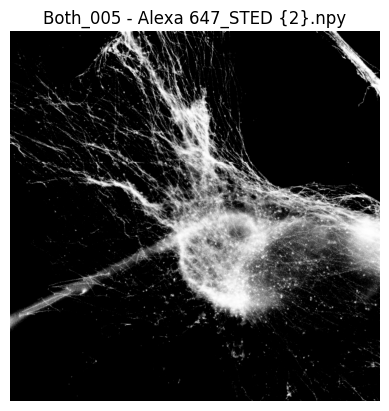

...

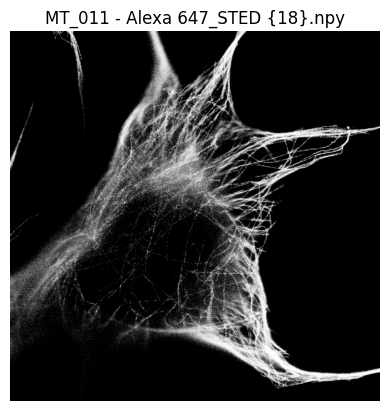

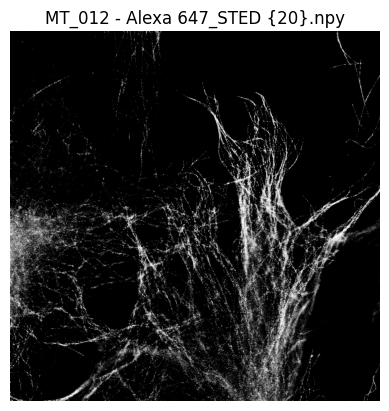

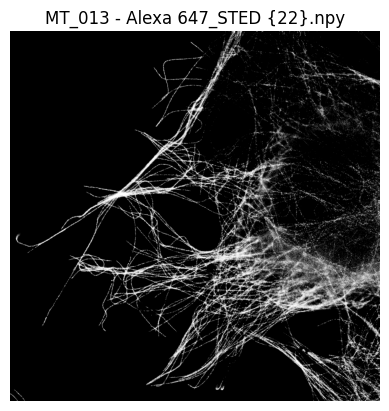

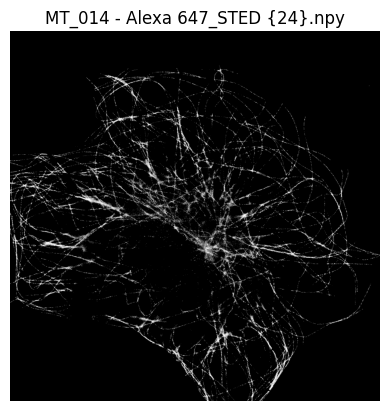

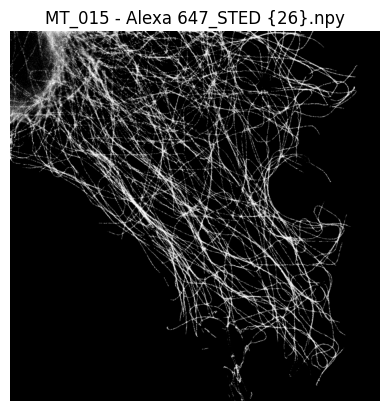

In [16]:
## Show the results with hist equal
for file, data in modified_files.items():
    plot_example(data, file.split('/')[-1])

C:\Users\belav\AppData\Local\Temp\ipykernel_5268\1079214156.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


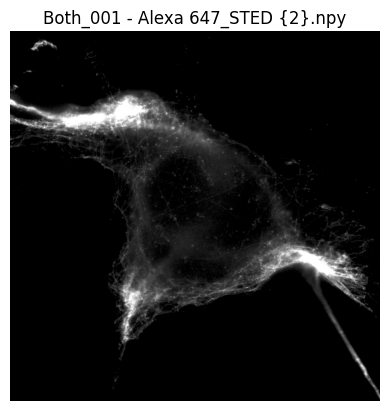

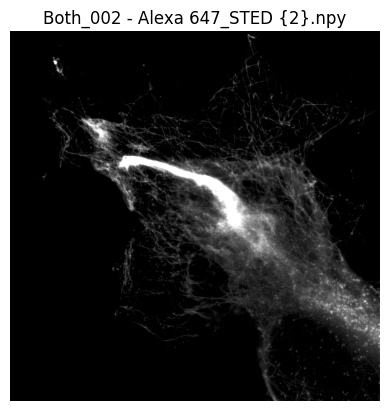

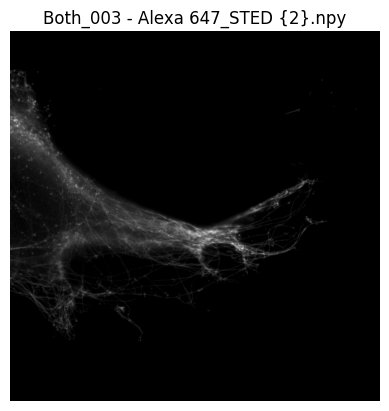

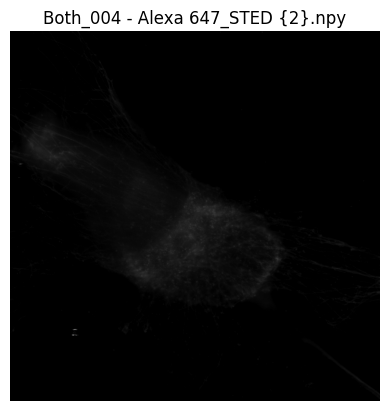

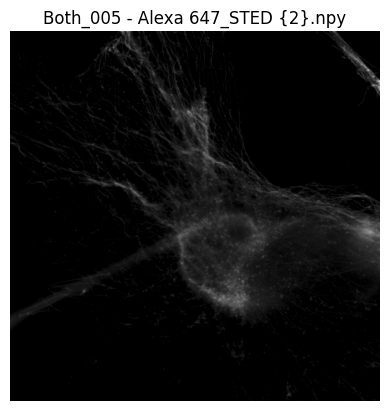

...

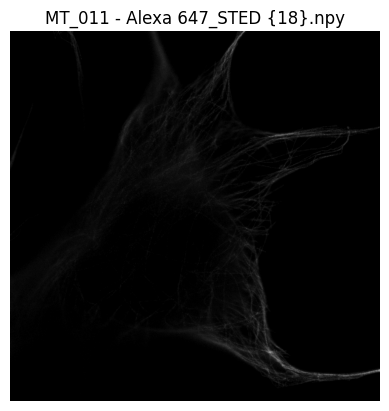

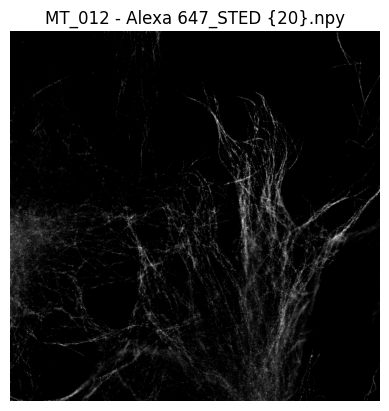

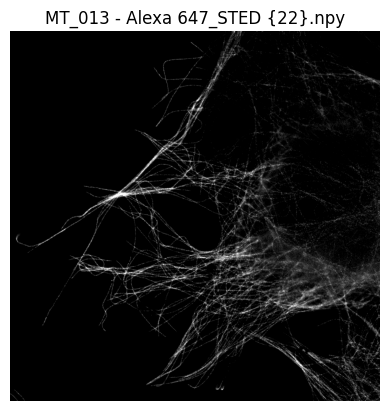

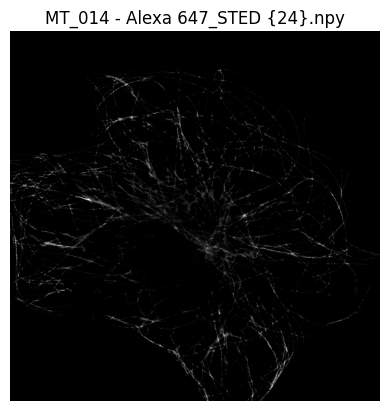

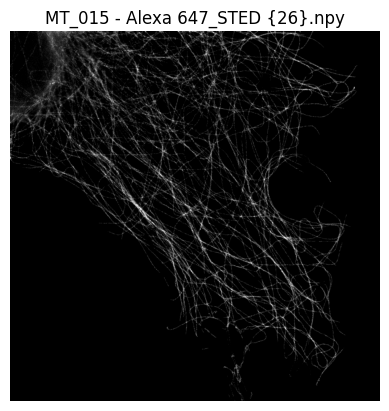

In [18]:
## Show the results no hist equal
for file, data in modified_files.items():
    plot_example(data, file.split('/')[-1])